In [ ]:
from pathlib import Path
from PIL import Image
import urllib.request
import matplotlib.pyplot as plt
import torch
import numpy
from torchvision import transforms as tfms
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from huggingface_hub import notebook_login

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

In [ ]:
# Set device
import os
torch_device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
if "mps" == torch_device: os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = "1"

In [ ]:
# Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae").to("cuda")

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

## step 1: load image

In [ ]:
def load_image(img_url_or_path):
  if img_url_or_path.startswith("https:"):
    img_path = "downloaded_img.jpg"
    img = urllib.request.urlretrieve(img_url_or_path, img_path)
  else: img_path = img_url_or_path
  img = Image.open(img_path).convert('RGB').resize((512, 512))
  # plt.imshow(img)
  # plt.axis("off")
  # plt.show()
  return img

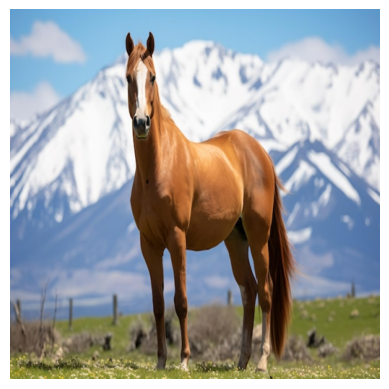

In [ ]:
img = load_image("https://img.freepik.com/premium-photo/horse-standing-field-with-mountain-background_1021856-16635.jpg")

## step 2: convert pil image to a latent representation

In [ ]:
def pil_to_latent(input_im):
    # Single image -> single latent in a batch (so size 1, 4, 64, 64)
    with torch.no_grad():
        latent = vae.encode(tfms.ToTensor()(input_im).unsqueeze(0).to(torch_device)*2-1) # Note scaling
    return 0.18215 * latent.latent_dist.sample()

def latents_to_pil(latents):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [ ]:
img_latent = pil_to_latent(img)

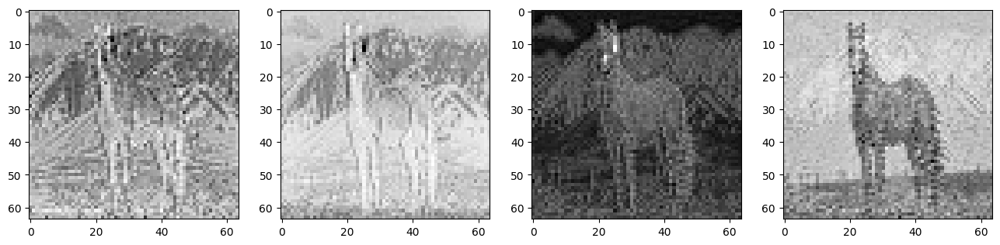

In [ ]:
# Let's visualize the four channels of this latent representation:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(img_latent[0][c].cpu(), cmap='Greys')

## step 3: add 50% gaussian noise to the latent

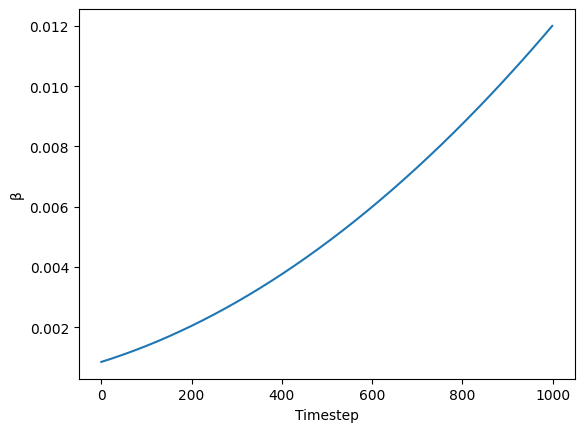

In [ ]:
beta_start,beta_end = 0.00085,0.012
plt.plot(torch.linspace(beta_start**0.5, beta_end**0.5, 1000) ** 2)
plt.xlabel('Timestep')
plt.ylabel('β');

In [ ]:
scheduler = LMSDiscreteScheduler(beta_start=beta_start, beta_end=beta_end, beta_schedule="scaled_linear", num_train_timesteps=1000)

In [ ]:
def add_noise_to_latent(latent, num_inference_steps, step_to_add_noise):
  scheduler.set_timesteps(num_inference_steps)
  # add 50% gaussian noise and display
  noise = torch.randn_like(latent) # Random noise
  encoded_and_noised = scheduler.add_noise(latent, noise, timesteps=torch.tensor([scheduler.timesteps[step_to_add_noise]]))
  return encoded_and_noised

In [ ]:
noised_img = add_noise_to_latent(img_latent, 50, 20)

NameError: name 'img_latent' is not defined

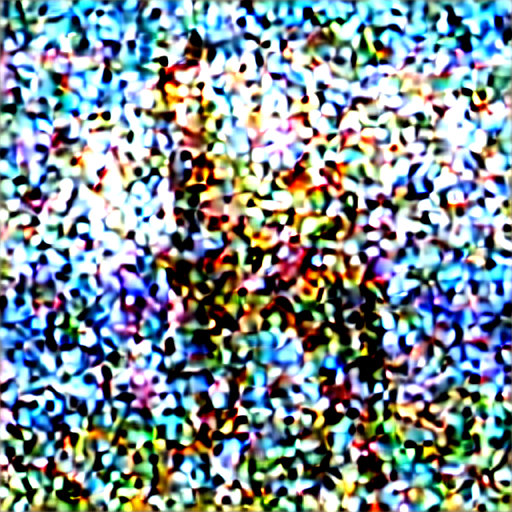

In [ ]:
latents_to_pil(noised_img.float())[0] # Display

In [ ]:
noised_img.shape

torch.Size([1, 4, 64, 64])

In [ ]:
noised_img

tensor([[[[ 2.2752, -0.4444, -1.2033,  ...,  0.0405, -0.1073,  0.6491],
          [-0.3824,  0.5441,  2.4427,  ..., -0.6428, -0.7420,  0.6307],
          [ 5.4444,  0.9540,  0.9257,  ...,  1.3872, -4.8360,  1.8585],
          ...,
          [ 4.7560,  0.9343, -2.4975,  ...,  2.9193,  3.4850, -1.1263],
          [ 1.4467,  0.5414, -0.2362,  ..., -0.2811, -0.3201, -1.8736],
          [ 3.7562, -1.4620,  1.9218,  ...,  0.3270,  1.1083,  2.5980]],

         [[-5.4928, -0.1688,  3.1631,  ..., -2.6739,  0.6548,  2.3477],
          [-3.6741, -0.8256,  0.5918,  ...,  0.3741, -1.0836,  2.4126],
          [-0.3248, -0.9685, -1.3906,  ..., -1.6666, -2.8545, -3.9648],
          ...,
          [ 2.9372, -1.0988,  5.1518,  ..., -3.3533,  0.6470,  6.5964],
          [ 0.9612,  1.7124,  0.6592,  ...,  0.5838,  1.5159,  0.2675],
          [ 3.2015,  0.6206,  2.7922,  ...,  1.5896,  2.3525,  1.7922]],

         [[ 4.2105,  0.1816, -2.0164,  ...,  1.4188,  1.1521,  1.5628],
          [ 4.9186,  1.7684,  

## step 4: remove outlier noise from the noised latent

In [ ]:
num_elem = noised_img.numel()
mean = noised_img.mean()
std_dev = noised_img.std()
max = noised_img.max()
min = noised_img.min()
num_elem, mean, std_dev, max, min

In [ ]:
threshold = 2 * std_dev
beyond_2sd = (noised_img-mean).abs() > threshold
threshold, beyond_2sd

(tensor(4.7893, device='cuda:0'),
 tensor([[[[False, False, False,  ..., False, False, False],
           [False, False, False,  ..., False, False, False],
           [ True, False, False,  ..., False,  True, False],
           ...,
           [False, False, False,  ..., False, False, False],
           [False, False, False,  ..., False, False, False],
           [False, False, False,  ..., False, False, False]],
 
          [[ True, False, False,  ..., False, False, False],
           [False, False, False,  ..., False, False, False],
           [False, False, False,  ..., False, False, False],
           ...,
           [False, False,  True,  ..., False, False,  True],
           [False, False, False,  ..., False, False, False],
           [False, False, False,  ..., False, False, False]],
 
          [[False, False, False,  ..., False, False, False],
           [False, False,  True,  ...,  True, False, False],
           [False, False, False,  ..., False, False, False],
           ..

In [ ]:
beyond_2sd.sum().item() / num_elem

0.0455322265625

In [ ]:
def remove_outliers(noised_latent, n):
  m = noised_latent.mean()
  s = noised_latent.std()
  return torch.clamp(noised_latent, m - n * s, m + n * s)

In [ ]:
cleaned_latent = remove_outliers(noised_img, 2)

In [ ]:
cleaned_latent

tensor([[[[ 2.2752, -0.4444, -1.2033,  ...,  0.0405, -0.1073,  0.6491],
          [-0.3824,  0.5441,  2.4427,  ..., -0.6428, -0.7420,  0.6307],
          [ 5.0473,  0.9540,  0.9257,  ...,  1.3872, -4.5312,  1.8585],
          ...,
          [ 4.7560,  0.9343, -2.4975,  ...,  2.9193,  3.4850, -1.1263],
          [ 1.4467,  0.5414, -0.2362,  ..., -0.2811, -0.3201, -1.8736],
          [ 3.7562, -1.4620,  1.9218,  ...,  0.3270,  1.1083,  2.5980]],

         [[-4.5312, -0.1688,  3.1631,  ..., -2.6739,  0.6548,  2.3477],
          [-3.6741, -0.8256,  0.5918,  ...,  0.3741, -1.0836,  2.4126],
          [-0.3248, -0.9685, -1.3906,  ..., -1.6666, -2.8545, -3.9648],
          ...,
          [ 2.9372, -1.0988,  5.0473,  ..., -3.3533,  0.6470,  5.0473],
          [ 0.9612,  1.7124,  0.6592,  ...,  0.5838,  1.5159,  0.2675],
          [ 3.2015,  0.6206,  2.7922,  ...,  1.5896,  2.3525,  1.7922]],

         [[ 4.2105,  0.1816, -2.0164,  ...,  1.4188,  1.1521,  1.5628],
          [ 4.9186,  1.7684,  

In [ ]:
cleaned_latent.max(), cleaned_latent.min(), cleaned_latent.mean(), cleaned_latent.std()

(tensor(5.0473, device='cuda:0'),
 tensor(-4.5312, device='cuda:0'),
 tensor(0.2580, device='cuda:0'),
 tensor(2.3002, device='cuda:0'))

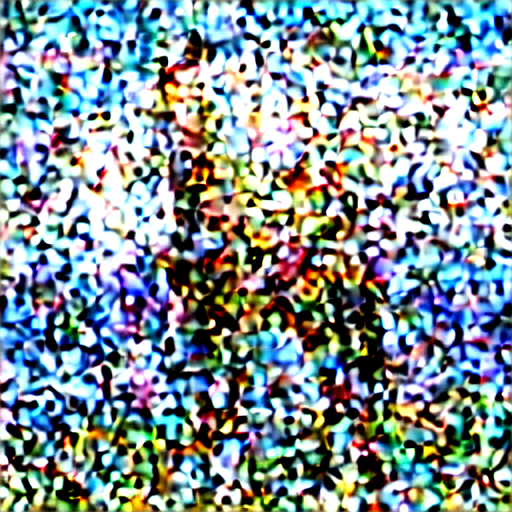

In [ ]:
latents_to_pil(cleaned_latent.float())[0] # Display

## step 5: denoising the noised latent conditioned on the reference text and the query

In [ ]:
from tqdm.auto import tqdm
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet", torch_dtype=torch.float16).to("cuda")
from transformers import CLIPTextModel, CLIPTokenizer
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16)
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16).to("cuda")

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


config.json:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

In [ ]:
def text_enc(prompts, maxlen=None):
  # tokenize and encode prompts
  if not maxlen: maxlen = tokenizer.model_max_length
  inp = tokenizer(prompts, padding="max_length", max_length=maxlen, truncation=True, return_tensors="pt")
  return text_encoder(inp.input_ids.to("cuda"))[0].half()

In [ ]:
def denoise_with_prompt(noised_latent, prompts, guidance_scale=10.0, num_inference_steps=50, start_step=25, stop_step=38):

  bs = len(prompts)
  text = text_enc(prompts)
  uncond = text_enc([""] * bs, text.shape[1])
  emb = torch.cat([uncond, text])
  text_embeddings = emb.to(dtype=torch.float16, device=torch_device)

  encoded = noised_latent
  scheduler.set_timesteps(num_inference_steps)

  # Prep latents (noising appropriately for start_step)
  # start_sigma = scheduler.sigmas[start_step]
  # noise = torch.randn_like(encoded)
  # latents = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[start_step]]))
  latents = encoded.to(torch_device).float()
  latents = latents.to(dtype=torch.float16, device=torch_device)

  # Loop
  for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):

    if i == stop_step: break

    if i >= start_step:

        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        latents = scheduler.step(noise_pred, t, latents).prev_sample

  return latents

## step 6: average spatial diff over several runs and create a binary mask

In [ ]:
def create_binary_mask(diff_tensor, threshold=0.1):
    # Add Gaussian blur before thresholding to smooth boundaries
    from torchvision.transforms import functional as F

    # Normalize
    min_val = diff_tensor.min()
    max_val = diff_tensor.max()
    normalized = (diff_tensor - min_val) / (max_val - min_val)

    # Smooth
    smoothed = F.gaussian_blur(normalized, kernel_size=3, sigma=1.0)

    # Threshold with optional dilation
    binary = (smoothed > threshold).float()

    # # Optional: Dilate mask to "overshoot"
    # kernel = torch.ones(3, 3).to(binary.device)
    # dilated = F.conv2d(binary, kernel.view(1, 1, 3, 3), padding=1) > 0

    return binary

In [ ]:
def average_diff_over_multiple_runs(noised_latent, ref_prompt, query_prompt, n_runs):
  accumulated_diff = torch.zeros_like(noised_latent)
  for i in range(n_runs):
    denoised_ref = denoise_with_prompt(noised_latent, prompts=[ref_prompt], num_inference_steps=50, start_step=20, stop_step=45)
    denoised_query = denoise_with_prompt(noised_latent, prompts=[query_prompt], num_inference_steps=50, start_step=20, stop_step=45)
    diff = (denoised_query - denoised_ref).abs()
    accumulated_diff += diff
  avg_diff = accumulated_diff/n_runs
  return avg_diff

In [ ]:
avg_diff = average_diff_over_multiple_runs(cleaned_latent, "A horse standing in a field with a mountain in the background", "A zebra standing in a field with a mountain in the background", 5)

In [ ]:
mask = create_binary_mask(avg_diff)

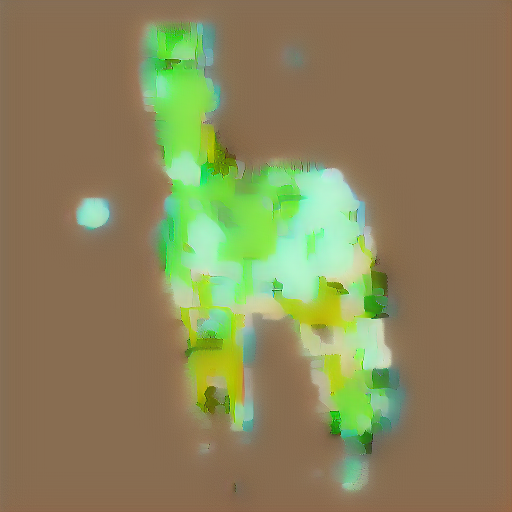

In [ ]:
latents_to_pil(mask.float())[0]

In [ ]:
mask.sum() / mask.numel()

tensor(0.1677, device='cuda:0')

## step 7: denoise encoded image with the query prompt for inside the mask and the original encoding path outside it

In [ ]:
def final_denoising(input_image, mask, query):
    num_inference_steps = 50
    uncond_prompt = [""]
    query_prompt = [query]
    start_step = 25
    guidance_scale = 10.0
    batch_size = 1
    xt = []
    yt = []

    # Set the dtype we want to use
    dtype = torch.float16  # or torch.float32 depending on your model

    # Step 1: encode image and add noise for 25 timesteps
    latents = pil_to_latent(input_image).to(dtype)
    # Ensure mask is in the same format as latents
    mask = mask.to(latents.device).to(dtype)

    scheduler.set_timesteps(num_inference_steps)
    noise = torch.randn_like(latents)
    noised_latents = scheduler.add_noise(
        latents,
        noise,
        timesteps=torch.tensor([scheduler.timesteps[start_step]], device=latents.device)
    )
    noised_latents = noised_latents.to(torch_device).to(dtype)

    # Step 2: Unconditional denoising (empty prompt)
    text_input = tokenizer(
        uncond_prompt,
        padding="max_length",
        max_length=tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt"
    ).to(torch_device)

    with torch.no_grad():
        uncond_embeddings = text_encoder(text_input.input_ids)[0].to(dtype)

    # Initialize latents for unconditional denoising
    latents_uncond = noised_latents.clone()
    # Unconditional denoising loop
    for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
        if i >= start_step:
            latent_model_input = scheduler.scale_model_input(latents_uncond, t)

            with torch.no_grad():
                noise_pred = unet(
                    latent_model_input,
                    t.to(dtype),
                    encoder_hidden_states=uncond_embeddings
                )["sample"]

            latents_uncond = scheduler.step(noise_pred, t, latents_uncond).prev_sample
            xt.append(latents_uncond)
        else:
            xt.append(None)

    # Step 3: Conditional denoising (query prompt)
    query_text_input = tokenizer(
        query_prompt,
        padding="max_length",
        max_length=tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt"
    ).to(torch_device)

    with torch.no_grad():
        query_embeddings = text_encoder(query_text_input.input_ids)[0].to(dtype)

    text_embeddings = torch.cat([uncond_embeddings, query_embeddings])
    latents_cond = noised_latents.clone()

    # Conditional denoising loop with mask composition
    scheduler.set_timesteps(num_inference_steps)
    for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
        if i >= start_step:
            latent_model_input = torch.cat([latents_cond] * 2)
            latent_model_input = scheduler.scale_model_input(latent_model_input, t)

            with torch.no_grad():
                noise_pred = unet(
                    latent_model_input,
                    t.to(dtype),
                    encoder_hidden_states=text_embeddings
                )["sample"]

            noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
            noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
            latents_cond = scheduler.step(noise_pred, t, latents_cond).prev_sample

            # Compose masked and unmasked regions
            if xt[i] is not None:
                latents_cond = mask * latents_cond + (1 - mask) * xt[i]

            yt.append(latents_cond)
        else:
            yt.append(None)

    return xt, yt

In [ ]:
xt, yt = final_denoising(img, mask)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
len(xt), len(yt)

(50, 50)

In [ ]:
xt[-1].shape, yt[-1].shape

(torch.Size([1, 4, 64, 64]), torch.Size([1, 4, 64, 64]))

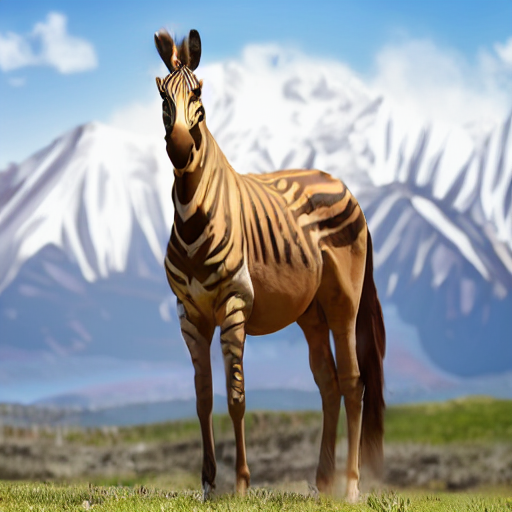

In [ ]:
latents_to_pil(yt[-1].float())[0]

## put it all together

In [ ]:
def compute_mask(img, ref_prompt: str, query: str):
  # convert image to a latent
  img_latent = pil_to_latent(img)
  # add 50% noise to latent
  noised_img = add_noise_to_latent(img_latent, 50, 20)
  # remove outlier noise (noise beyond 2 standard deviations)
  cleaned_latent = remove_outliers(noised_img, 2)
  # calculate mask by averaging difference between denoising on ref and query over several runs
  avg_diff = average_diff_over_multiple_runs(cleaned_latent, ref_prompt, query, 5)
  # binarize mask and return it
  mask = create_binary_mask(avg_diff)
  return mask

In [ ]:
def diffedit(img_url_or_path, ref_prompt, query):
  # load image
  img = load_image(img_url_or_path)
  # calculate mask
  mask = compute_mask(img, ref_prompt, query)
  xt, yt = final_denoising(img, mask, query)
  edit = latents_to_pil(yt[-1].float())[0]
  mask = latents_to_pil(mask.float())[0]
  return img, mask, edit

In [ ]:
url = "https://img.freepik.com/premium-photo/horse-standing-field-with-mountain-background_1021856-16635.jpg"
img, mask, edited = diffedit(url, "horse", "zebra")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

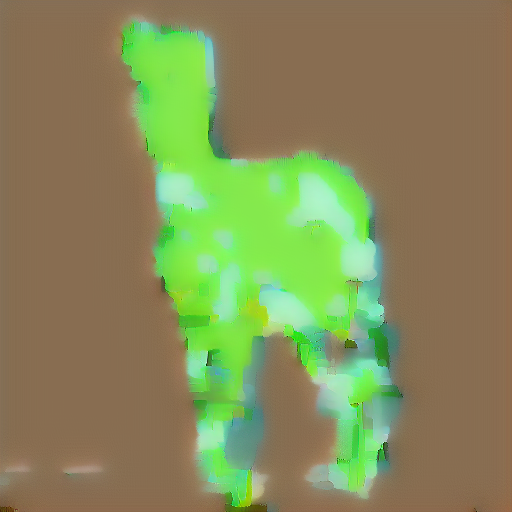

In [ ]:
mask

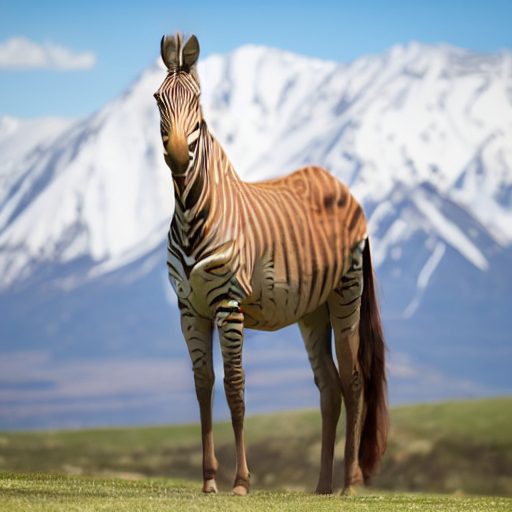

In [ ]:
edited

In [ ]:
url = "https://replicate.delivery/pbxt/IyIBdgYw3DehQHUxK1t0dkX5vmS7QYqzgHmeEYGaxSv4uDUE/origin.png"
img, mask, edited = diffedit(url, "fruits", "black grapes")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

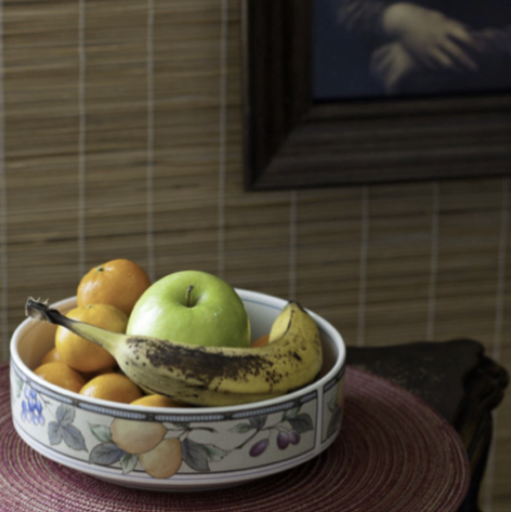

In [ ]:
img

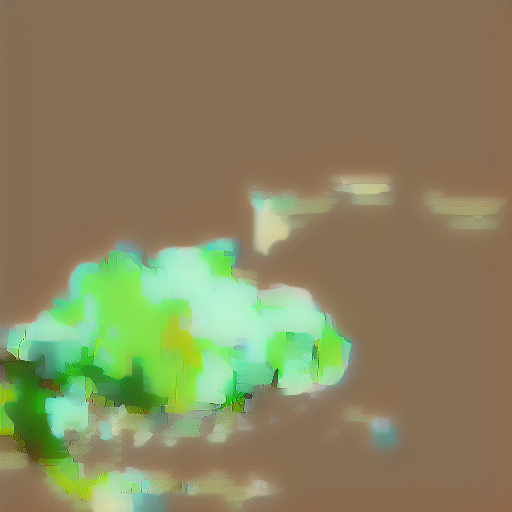

In [ ]:
mask

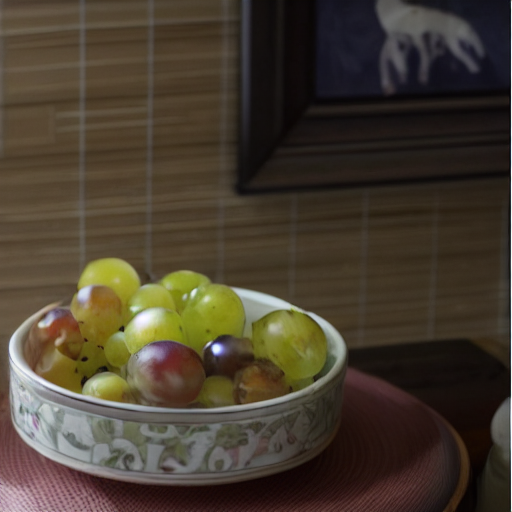

In [ ]:
edited

In [ ]:
url = "https://cdn.mos.cms.futurecdn.net/C45f3LZsk7Da4bJ2tYDpaF.jpg"
img, mask, edited = diffedit(url, "a camel with four legs", "a horse with four legs")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

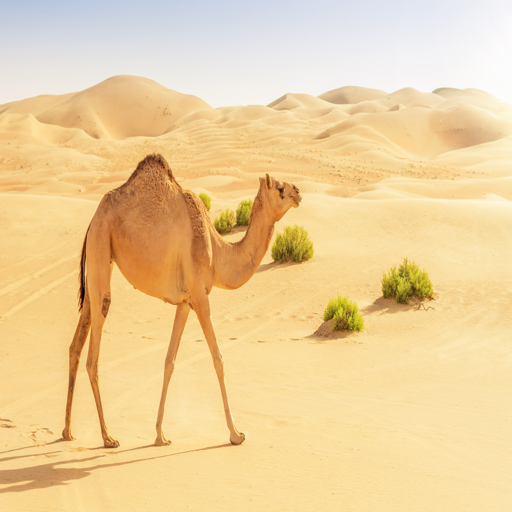

In [ ]:
img

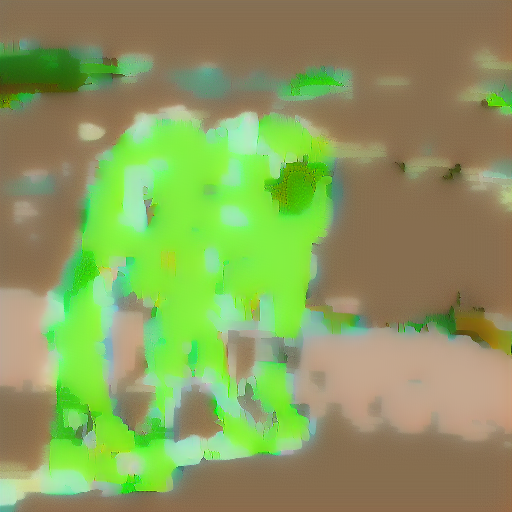

In [ ]:
mask

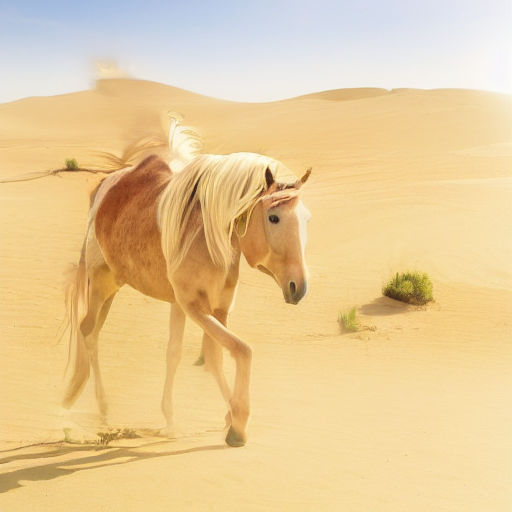

In [ ]:
edited

In [ ]:
url = "https://c8.alamy.com/comp/D5KR42/fresh-strawberries-in-a-pink-bowl-isolated-over-white-D5KR42.jpg"
img, mask, edited = diffedit(url, "strawberries", "apples")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

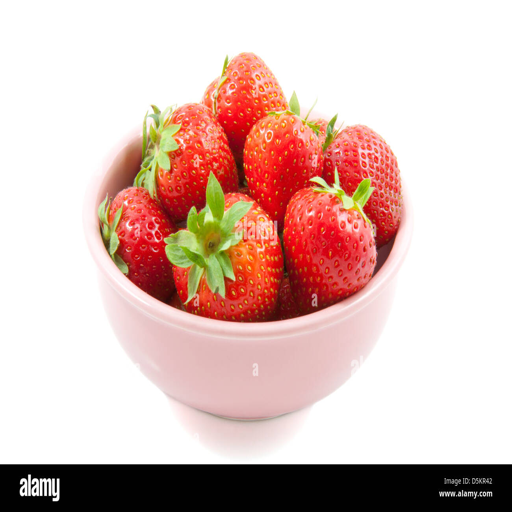

In [ ]:
img

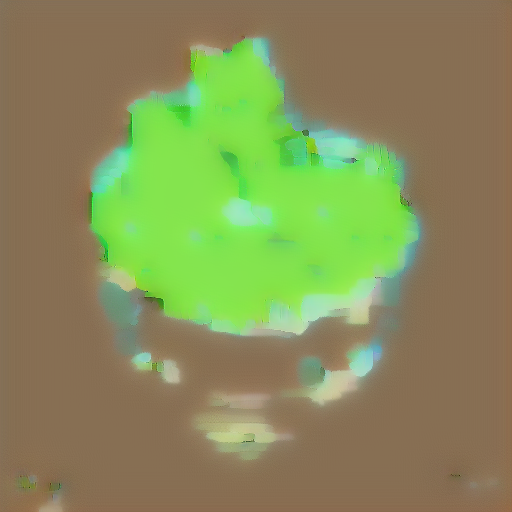

In [ ]:
mask

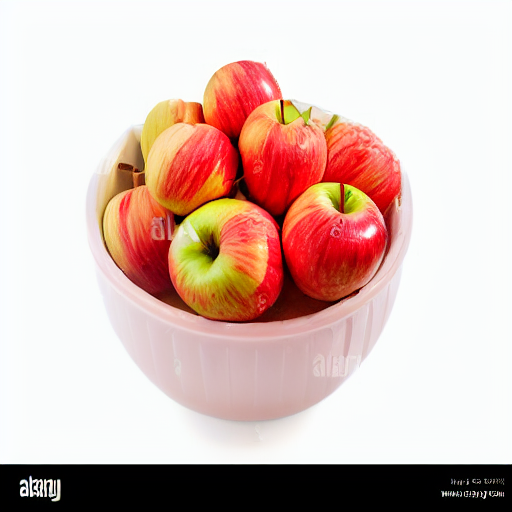

In [ ]:
edited

In [ ]:
url = "https://c8.alamy.com/comp/D5KR42/fresh-strawberries-in-a-pink-bowl-isolated-over-white-D5KR42.jpg"
img, mask, edited = diffedit(url, "bowl", "basket")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

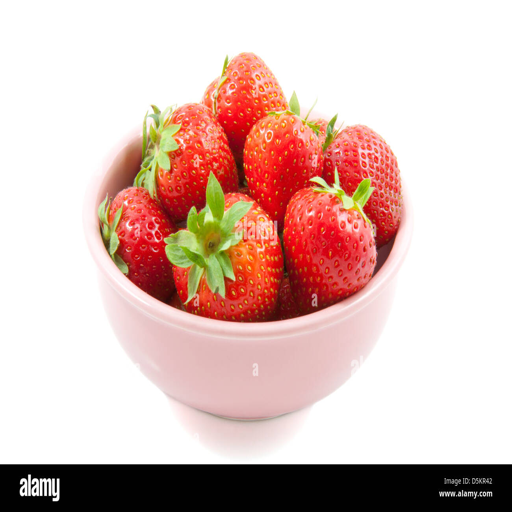

In [ ]:
img

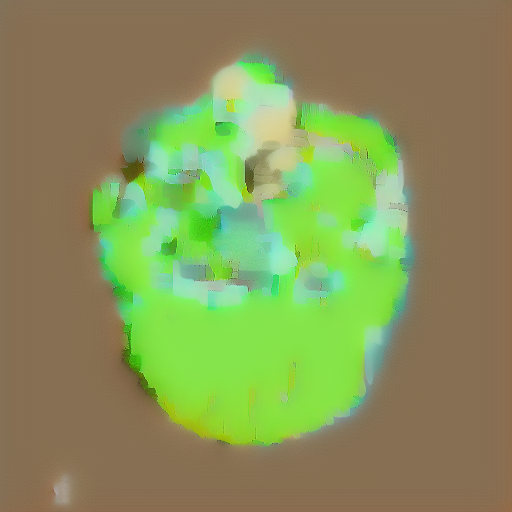

In [ ]:
mask

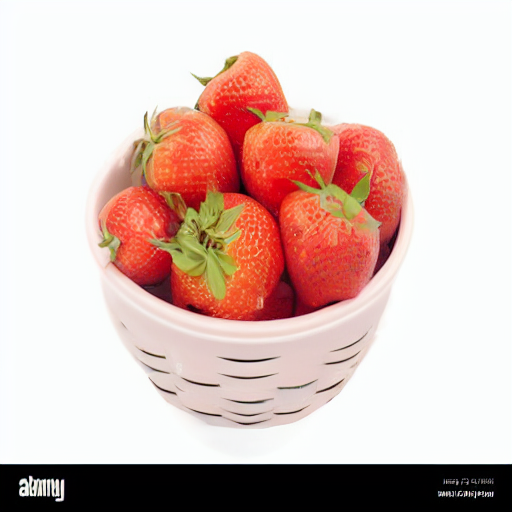

In [ ]:
edited

In [ ]:
url = "https://img.freepik.com/premium-photo/bowl-salad-with-lettuce-tomato-cucumber_667286-1603.jpg"
img, mask, edited = diffedit(url, "salad", "soup")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

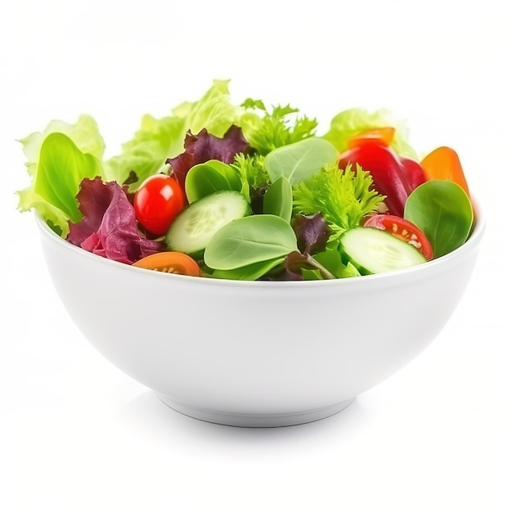

In [ ]:
img

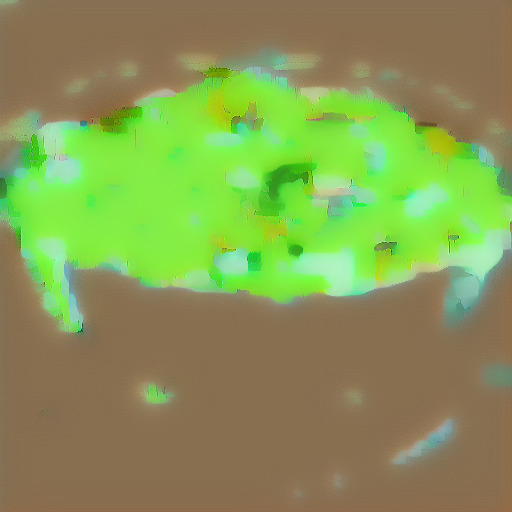

In [ ]:
mask

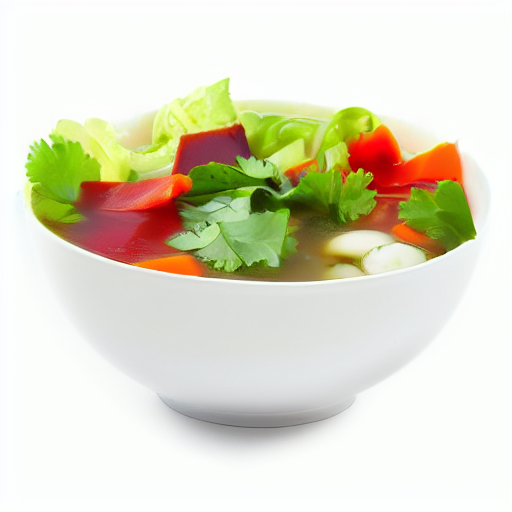

In [ ]:
edited

In [ ]:
url = "https://www.shutterstock.com/image-photo/mixed-vegetables-white-ceramic-bowl-260nw-1613845210.jpg"
img, mask, edited = diffedit(url, "vegetables", "oranges")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

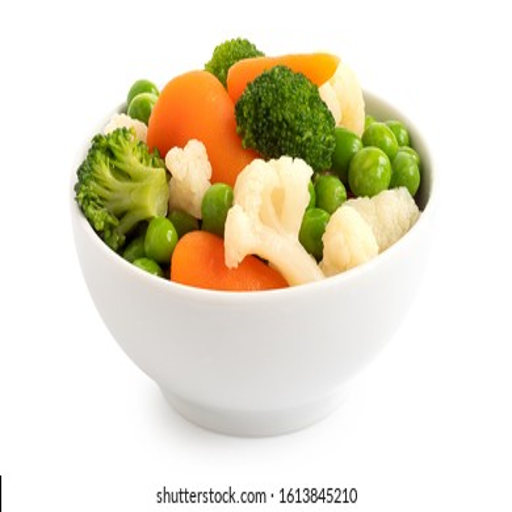

In [ ]:
img

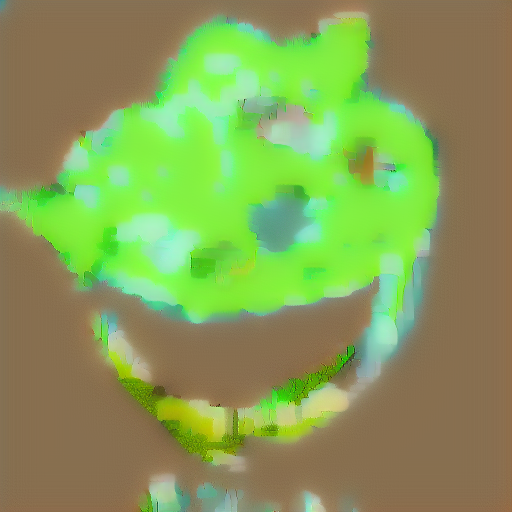

In [ ]:
mask

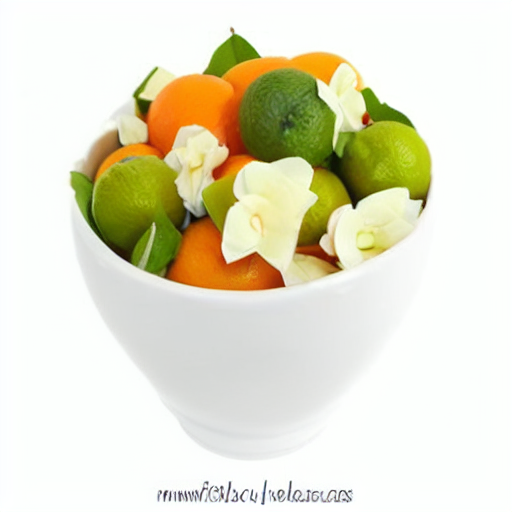

In [ ]:
edited